# Using OpenSTL in your own project

In this notebook, we will provide a comprehensive guide on how to use OpenSTL for your own project. 

Firstly, we will process video data into `.npy` format for easier storage and access. Next, we will demonstrate how to utilize custom data within OpenSTL. Subsequently, we will use OpenSTL to train and evaluate models. Finally, we will visualize predicted frames and generate `.gif` images or videos. 

- [1. Preprocess your data](#1-process-your-data)
    - [1.1 Save the dataset](#11-save-the-dataset)
    - [1.2 Load the dataset and visualize an example](#12-load-the-dataset-and-visualize-an-example)

- [2. Utilize cumtom data](#2-utilize-cumtom-data)
    - [2.1 Define the dataset](#21-define-the-dataset)
    - [2.2 Get the dataloaders](#22-get-the-dataloaders)

- [3. Train and evaluate](#3-train-and-evaluate)
    - [3.1 Define the custom configs](#31-define-the-custom-configs)
    - [3.2 Setup the experiment](#32-setup-the-experiment)
    - [3.3 Start training and evaluation](#33)

- [4. Visualization](#4-visualization)
    - [4.1 Visualize in a line](#41-visualize-in-a-line)
    - [4.2 Generate a GIF](#42-generate-a-gif)

Here we go!

In [1]:
pre_seq_length = 10
aft_seq_length = 10
full_seq_length = pre_seq_length+aft_seq_length+1

## 0. Convert input data to compatible formats

### 0.1. Convert DAD dataset's data 

##### Initial restructured folder structure of DAD dataset with .mp4 type videos

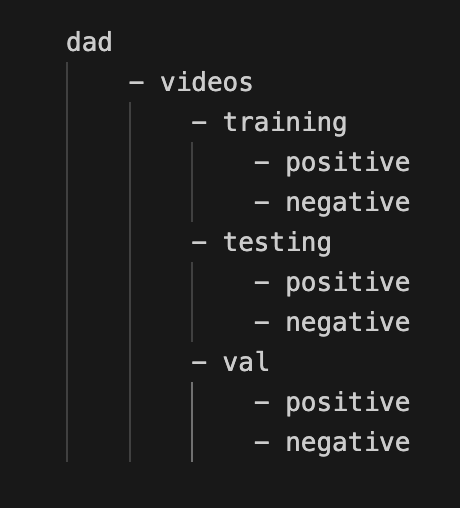

"Convert all videos in a folder" function breaks down each video into 'full_seq_length' number of frames, then saves them in the corresponding 'train', 'test', and 'val' folders.

In [2]:
import cv2

def convert_video_to_avi(input_file, output_file, width, height, frames):
    cap = cv2.VideoCapture(input_file)

    if not cap.isOpened():
        print("Error: Could not open video.")
        return

    fps = cap.get(cv2.CAP_PROP_FPS)
    fourcc = cv2.VideoWriter_fourcc(*'XVID')

    frame_count = 0
    part_number = 1
    out = None

    while True:
        ret, frame = cap.read()

        if not ret:
            if frame_count > 0:
                # Release the last part if it contains enough frames
                if frame_count >= frames:
                    out.release()
                else:
                    # Remove the last part if it doesn't meet the frame requirement
                    output_part = f"{output_file}_part{part_number}.avi"
                    if os.path.exists(output_part):
                        os.remove(output_part)
            break

        if frame_count % frames == 0:
            # Close previous video writer and create a new one for each part
            if out is not None:
                out.release()

            output_part = f"{output_file}_part{part_number}.avi"
            out = cv2.VideoWriter(output_part, fourcc, fps, (width, height))
            part_number += 1
            frame_count = 0

        resized_frame = cv2.resize(frame, (width, height))
        out.write(resized_frame)
        frame_count += 1

    cap.release()
    if out is not None:
        out.release()


In [3]:
import os

def convert_all_videos_in_folder(input_folder, output_folder, tag, frames):
    os.makedirs(output_folder, exist_ok=True)
    for filename in os.listdir(input_folder):
        if filename.endswith('.mp4'):
            input_video_path = os.path.join(input_folder, filename)
            output_video_name = f"{os.path.splitext(filename)[0]}{tag}"
            output_video_path = os.path.join(output_folder, output_video_name)
            convert_video_to_avi(input_video_path, output_video_path,128,128, frames)
    print('Successfully Converted')


In [4]:
input_train = 'dad/videos/training/positive'  
output_train = 'train'  
#convert_all_videos_in_folder(input_train, output_train,"_p",full_seq_length)

In [5]:
input_train = 'dad/videos/training/negative'  
output_train = 'train'  
#convert_all_videos_in_folder(input_train, output_train,"_n",full_seq_length)

In [6]:
input_test = 'dad/videos/testing/positive'  
output_test = 'test'  
#convert_all_videos_in_folder(input_test, output_test,"_p",full_seq_length)

In [7]:
input_test = 'dad/videos/testing/negative'  
output_test = 'test'  
#convert_all_videos_in_folder(input_test, output_test,"_n",full_seq_length)

In [8]:
input_val = 'dad/videos/val/positive'  
output_val = 'val' 
#convert_all_videos_in_folder(input_val, output_val,"_p",full_seq_length)

In [9]:
input_val = 'dad/videos/val/negative'  
output_val = 'val' 
#convert_all_videos_in_folder(input_val, output_val,"_n",full_seq_length)

## 1. Process your data

Assume you possess a collection of videos and have already sorted them into the `train/`, `val/`, and `test/` directories. The subsequent step involves transforming these videos into a `.pkl` file for further manipulations.

The existing file hierarchy is as follows:

- custom_usage.ipynb
- train
  - train_example1.avi
  - train_example2.avi
- val
  - val_example1.avi
  - val_example2.avi
- test
  - test_example.avi

It's crucial to note that the above example represents a simplified scenario where we've used `.avi` videos for illustrative purposes. However, in a real-world application, you are free to employ videos in various other formats.

We utilize several videos from the KTH dataset as examples. Although the original KTH dataset consists of single-channel grayscale videos, we save them as three-channel RGB videos to accommodate a broader range of use cases.

### 1.1 Save the dataset

Here, we default to uniformly sampling several frames from the given video data. The number of observed frames and future frames are two hyperparameters (`pre_seq_length`, `aft_seq_length`) that are set in advance. You can also choose to sample the video in other ways and save the data.

#### hyperparameters

`pre_seq_length`: the number of given frames

`aft_seq_length`: the number of frames to predict

In [10]:
import cv2
import numpy as np
import os

def sample_frames(video_path, num_frames=20):
    # read the video
    video = cv2.VideoCapture(video_path)
    total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    # uniformly sample frames for given frame count from the video
    frame_idxs = np.linspace(0, total_frames-1, num_frames, dtype=int)
    frames = []
    for idx in frame_idxs:
        video.set(cv2.CAP_PROP_POS_FRAMES, idx)
        _, frame = video.read()
        # frame = cv2.resize(frame, (height, width))
        frames.append(frame)
    video.release()
    return np.stack(frames)

def process_folder(folder_path, pre_slen=10, aft_slen=10, suffix='.avi'):
    # get all the videos in this folder
    videos = []
    files = os.listdir(folder_path)
    for file in files:
        video_path = os.path.join(folder_path, file)
        if os.path.isfile(video_path) and file.endswith(suffix):
            video = sample_frames(video_path, pre_slen + aft_slen)
            videos.append(video)
    # stack video frames from each folder
    data = np.stack(videos).transpose(0, 1, 4, 2, 3)

    # if the data is in [0, 255], rescale it into [0, 1]
    if data.max() > 1.0:
        data = data.astype(np.float32) / 255.0

    return data[:, :pre_slen], data[:, pre_slen:]

In [11]:
import pickle

dataset = {}
folders = ['train', 'val', 'test']
for folder in folders:
    data_x, data_y = process_folder(folder, pre_slen=pre_seq_length, aft_slen=aft_seq_length, suffix='.avi')
    dataset['X_' + folder], dataset['Y_' + folder] = data_x, data_y

# save as a pkl file
with open('dataset.pkl', 'wb') as f:
    pickle.dump(dataset, f)

### 1.2 Load the dataset and visualize an example

In [12]:
import pickle

# load the dataset
with open('dataset.pkl', 'rb') as f:
    dataset = pickle.load(f)

train_x, train_y = dataset['X_train'], dataset['Y_train']
print(train_x.shape)
# the shape is B x T x C x H x W
# B: the number of samples
# T: the number of frames in each sample
# C, H, W: the channel, height, width of each frame

(3100, 10, 3, 128, 128)


## 2. Utilize cumtom data

### 2.1 Define the dataset

We first define the `CustomDataset` to use the provided dataset. 

For real video prediction, to facilitate model optimization, we strongly recommend users to use frames represented as `float32` with values in the range of $[0, 1]$, rather than frames represented as `uint8` with values in the range of $[0, 255]$. For other types of data, we also provide the option to `normalize` in the `CustomDataset`.

In [15]:
import torch
from torch.utils.data import Dataset


class CustomDataset(Dataset):
    def __init__(self, X, Y, normalize=False, data_name='custom'):
        super(CustomDataset, self).__init__()
        self.X = X
        self.Y = Y
        self.mean = None
        self.std = None
        self.data_name = data_name

        if normalize:
            # get the mean/std values along the channel dimension
            mean = data.mean(axis=(0, 1, 2, 3)).reshape(1, 1, -1, 1, 1)
            std = data.std(axis=(0, 1, 2, 3)).reshape(1, 1, -1, 1, 1)
            data = (data - mean) / std
            self.mean = mean
            self.std = std

    def __len__(self):
        return self.X.shape[0]

    def __getitem__(self, index):
        data = torch.tensor(self.X[index]).float()
        labels = torch.tensor(self.Y[index]).float()
        return data, labels

### 2.2 Get the dataloaders

Now we can get the dataloaders by using the collected dataset and the defined `CustomDataset`.

#### hyperparameters

`batch_size`: the size of a batch

In [16]:
batch_size = 10

In [17]:
X_train, X_val, X_test, Y_train, Y_val, Y_test = dataset['X_train'], dataset[
    'X_val'], dataset['X_test'], dataset['Y_train'], dataset['Y_val'], dataset['Y_test']

train_set = CustomDataset(X=X_train, Y=Y_train)
val_set = CustomDataset(X=X_val, Y=Y_val)
test_set = CustomDataset(X=X_test, Y=Y_test)

In [18]:
dataloader_train = torch.utils.data.DataLoader(
    train_set, batch_size=batch_size, shuffle=True, pin_memory=True)
dataloader_val = torch.utils.data.DataLoader(
    val_set, batch_size=batch_size, shuffle=True, pin_memory=True)
dataloader_test = torch.utils.data.DataLoader(
    test_set, batch_size=batch_size, shuffle=True, pin_memory=True)

## 3. Train and evaluate

### 3.1 Define the custom configs

We first define the training configuration, which includes several important hyperparameters for training.

Here, we set `epoch = 3` as an example for simple training. The actual value of epoch in your project depends on the complexity of your dataset. Generally, a good starting point is `epoch = 100`.

Next, we define the model configuration to customize a spatio-temporal predictive learning model. For MetaVP models, the key hyperparameters are: `N_S`, `N_T`, `hid_S`, `hid_T`, and `model_type`. Users have the option to either use a config file or directly set these hyperparameters.

If a config file is preferred, the user can simply include a `config_file` key with the path to the config file in the `custom_model_config` below. Otherwise, the user can directly specify these hyperparameters in the `custom_model_config`.

In [19]:
custom_training_config = {
    'pre_seq_length': pre_seq_length,
    'aft_seq_length': aft_seq_length,
    'total_length': pre_seq_length + aft_seq_length,
    'batch_size': batch_size,
    'val_batch_size': batch_size,
    'epoch': 50,
    'lr': 0.01,   
    'metrics': ['mse', 'mae'],

    'ex_name': 'custom_exp',
    'dataname': 'custom',
    'in_shape': [10, 3, 128,128],
}

custom_model_config = {
    # For MetaVP models, the most important hyperparameters are: 
    # N_S, N_T, hid_S, hid_T, model_type
    'method': 'TAU',
    # Users can either using a config file or directly set these hyperparameters 
    # 'config_file': 'configs/custom/example_model.py',
    
    # Here, we directly set these parameters
    'model_type': 'tau',
    'N_S': 4,
    'N_T': 8,
    'hid_S': 64,
    'hid_T': 256,
    'alpha':0.1
}

### 3.2 Setup the experiment

We retrieve the default hyperparameters by utilizing `create_parser` and update those hyperparameters that are defined in `custom_training_config` and `custom_model_config`. 

By utilizing `BaseExperiment`, we ensure that everything is prepared, including dataloader setup and model initialization.

In [20]:
from openstl.api import BaseExperiment
from openstl.utils import create_parser, default_parser

args = create_parser().parse_args([])
config = args.__dict__

# update the training config
config.update(custom_training_config)
# update the model config
config.update(custom_model_config)
# fulfill with default values
default_values = default_parser()
for attribute in default_values.keys():
    if config[attribute] is None:
        config[attribute] = default_values[attribute]

exp = BaseExperiment(args, dataloaders=(dataloader_train, dataloader_val, dataloader_test), strategy='auto')

/home/nimsara_20/anaconda3/envs/OpenSTL/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


### 3.3 Start training and evaluation

With everything in place, we are now ready to start training and evaluation. 

Here we go!

In [21]:
print('>'*35 + ' training ' + '<'*35)
exp.train()

print('>'*35 + ' testing  ' + '<'*35)
exp.test()

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> training <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<



  | Name      | Type        | Params | Mode 
--------------------------------------------------
0 | model     | SimVP_Model | 17.8 M | train
1 | criterion | MSELoss     | 0      | train
--------------------------------------------------
17.8 M    Trainable params
0         Non-trainable params
17.8 M    Total params
71.245    Total estimated model params size (MB)
263       Modules in train mode
0         Modules in eval mode


Environment info:
------------------------------------------------------------
sys.platform: linux
Python: 3.10.8 | packaged by conda-forge | (main, Nov 22 2022, 08:26:04) [GCC 10.4.0]
CUDA available: True
CUDA_HOME: /usr
NVCC: Cuda compilation tools, release 10.1, V10.1.243
GPU 0,1: Tesla T4
GCC: gcc (Ubuntu 9.4.0-1ubuntu1~20.04.2) 9.4.0
PyTorch: 2.4.1+cu121
PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.4.2 (Git Hash 1137e04ec0b5251ca2b4400a4fd3c667ce843d67)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gencode;arch=compute

Epoch 0, global step 310: 'val_loss' reached 0.01886 (best 0.01886), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=00-val_loss=0.019.ckpt' as top 1


Epoch 1: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.009
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.41it/s]Epoch 1: Lr: 0.0008152 | Train Loss: 0.0211315 | Vali Loss: 0.0150873

Epoch 1: 100%|█| 310/310 [04:56<00:00,  1.04it/s, v_num=0, train_loss_step=0.009

Epoch 1, global step 620: 'val_loss' reached 0.01509 (best 0.01509), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=01-val_loss=0.015.ckpt' as top 1


Epoch 2: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.011
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.41it/s]Epoch 2: Lr: 0.0013171 | Train Loss: 0.0148136 | Vali Loss: 0.0110491

Epoch 2: 100%|█| 310/310 [04:57<00:00,  1.04it/s, v_num=0, train_loss_step=0.011

Epoch 2, global step 930: 'val_loss' reached 0.01105 (best 0.01105), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=02-val_loss=0.011.ckpt' as top 1


Epoch 3: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.015
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 3: Lr: 0.0019888 | Train Loss: 0.0134723 | Vali Loss: 0.0134260

Epoch 3: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.015

Epoch 3, global step 1240: 'val_loss' was not in top 1


Epoch 4: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.012
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.47it/s]Epoch 4: Lr: 0.0028009 | Train Loss: 0.0124251 | Vali Loss: 0.0110636

Epoch 4: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.012

Epoch 4, global step 1550: 'val_loss' was not in top 1


Epoch 5: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.011
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.42it/s]Epoch 5: Lr: 0.0037180 | Train Loss: 0.0123852 | Vali Loss: 0.0129483

Epoch 5: 100%|█| 310/310 [04:56<00:00,  1.04it/s, v_num=0, train_loss_step=0.011

Epoch 5, global step 1860: 'val_loss' was not in top 1


Epoch 6: 100%|█| 310/310 [04:30<00:00,  1.15it/s, v_num=0, train_loss_step=0.010
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.42it/s]Epoch 6: Lr: 0.0046998 | Train Loss: 0.0123964 | Vali Loss: 0.0122499

Epoch 6: 100%|█| 310/310 [04:57<00:00,  1.04it/s, v_num=0, train_loss_step=0.010

Epoch 6, global step 2170: 'val_loss' was not in top 1


Epoch 7: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.012
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.44it/s]Epoch 7: Lr: 0.0057035 | Train Loss: 0.0120588 | Vali Loss: 0.0106990

Epoch 7: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.012

Epoch 7, global step 2480: 'val_loss' reached 0.01070 (best 0.01070), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=07-val_loss=0.011.ckpt' as top 1


Epoch 8: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.007
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.42it/s]Epoch 8: Lr: 0.0066851 | Train Loss: 0.0118394 | Vali Loss: 0.0108843

Epoch 8: 100%|█| 310/310 [04:56<00:00,  1.04it/s, v_num=0, train_loss_step=0.007

Epoch 8, global step 2790: 'val_loss' was not in top 1


Epoch 9: 100%|█| 310/310 [04:30<00:00,  1.15it/s, v_num=0, train_loss_step=0.009
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.42it/s]Epoch 9: Lr: 0.0076019 | Train Loss: 0.0122788 | Vali Loss: 0.0128147

Epoch 9: 100%|█| 310/310 [04:57<00:00,  1.04it/s, v_num=0, train_loss_step=0.009

Epoch 9, global step 3100: 'val_loss' was not in top 1


Epoch 10: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.48it/s]Epoch 10: Lr: 0.0084136 | Train Loss: 0.0116623 | Vali Loss: 0.0103758

Epoch 10: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 10, global step 3410: 'val_loss' reached 0.01038 (best 0.01038), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=10-val_loss=0.010.ckpt' as top 1


Epoch 11: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.42it/s]Epoch 11: Lr: 0.0090848 | Train Loss: 0.0116608 | Vali Loss: 0.0117792

Epoch 11: 100%|█| 310/310 [04:56<00:00,  1.04it/s, v_num=0, train_loss_step=0.01

Epoch 11, global step 3720: 'val_loss' was not in top 1


Epoch 12: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.45it/s]Epoch 12: Lr: 0.0095862 | Train Loss: 0.0115107 | Vali Loss: 0.0131732

Epoch 12: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.01

Epoch 12, global step 4030: 'val_loss' was not in top 1


Epoch 13: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 13: Lr: 0.0098957 | Train Loss: 0.0114366 | Vali Loss: 0.0098979

Epoch 13: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 13, global step 4340: 'val_loss' reached 0.00990 (best 0.00990), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=13-val_loss=0.010.ckpt' as top 1


Epoch 14: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 14: Lr: 0.0100000 | Train Loss: 0.0113694 | Vali Loss: 0.0100700

Epoch 14: 100%|█| 310/310 [04:56<00:00,  1.04it/s, v_num=0, train_loss_step=0.00

Epoch 14, global step 4650: 'val_loss' was not in top 1


Epoch 15: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.42it/s]Epoch 15: Lr: 0.0099797 | Train Loss: 0.0110201 | Vali Loss: 0.0099417

Epoch 15: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.01

Epoch 15, global step 4960: 'val_loss' was not in top 1


Epoch 16: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 16: Lr: 0.0099194 | Train Loss: 0.0108725 | Vali Loss: 0.0094885

Epoch 16: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 16, global step 5270: 'val_loss' reached 0.00949 (best 0.00949), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=16-val_loss=0.009.ckpt' as top 1


Epoch 17: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.49it/s]Epoch 17: Lr: 0.0098194 | Train Loss: 0.0106663 | Vali Loss: 0.0097398

Epoch 17: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.01

Epoch 17, global step 5580: 'val_loss' was not in top 1


Epoch 18: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 18: Lr: 0.0096807 | Train Loss: 0.0105447 | Vali Loss: 0.0099070

Epoch 18: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 18, global step 5890: 'val_loss' was not in top 1


Epoch 19: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 19: Lr: 0.0095042 | Train Loss: 0.0104971 | Vali Loss: 0.0101899

Epoch 19: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 19, global step 6200: 'val_loss' was not in top 1


Epoch 20: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 20: Lr: 0.0092915 | Train Loss: 0.0102304 | Vali Loss: 0.0100977

Epoch 20: 100%|█| 310/310 [04:56<00:00,  1.04it/s, v_num=0, train_loss_step=0.00

Epoch 20, global step 6510: 'val_loss' was not in top 1


Epoch 21: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 21: Lr: 0.0090442 | Train Loss: 0.0103361 | Vali Loss: 0.0107071

Epoch 21: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 21, global step 6820: 'val_loss' was not in top 1


Epoch 22: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 22: Lr: 0.0087644 | Train Loss: 0.0100532 | Vali Loss: 0.0095307

Epoch 22: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.01

Epoch 22, global step 7130: 'val_loss' was not in top 1


Epoch 23: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.42it/s]Epoch 23: Lr: 0.0084543 | Train Loss: 0.0098664 | Vali Loss: 0.0096304

Epoch 23: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.01

Epoch 23, global step 7440: 'val_loss' was not in top 1


Epoch 24: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 24: Lr: 0.0081163 | Train Loss: 0.0097557 | Vali Loss: 0.0094848

Epoch 24: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 24, global step 7750: 'val_loss' reached 0.00948 (best 0.00948), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=24-val_loss=0.009.ckpt' as top 1


Epoch 25: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.49it/s]Epoch 25: Lr: 0.0077533 | Train Loss: 0.0096643 | Vali Loss: 0.0097956

Epoch 25: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.01

Epoch 25, global step 8060: 'val_loss' was not in top 1


Epoch 26: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 26: Lr: 0.0073681 | Train Loss: 0.0094066 | Vali Loss: 0.0099000

Epoch 26: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 26, global step 8370: 'val_loss' was not in top 1


Epoch 27: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.49it/s]Epoch 27: Lr: 0.0069638 | Train Loss: 0.0091791 | Vali Loss: 0.0093652

Epoch 27: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 27, global step 8680: 'val_loss' reached 0.00937 (best 0.00937), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=27-val_loss=0.009.ckpt' as top 1


Epoch 28: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.42it/s]Epoch 28: Lr: 0.0065437 | Train Loss: 0.0093707 | Vali Loss: 0.0092096

Epoch 28: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 28, global step 8990: 'val_loss' reached 0.00921 (best 0.00921), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=28-val_loss=0.009.ckpt' as top 1


Epoch 29: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 29: Lr: 0.0061112 | Train Loss: 0.0088242 | Vali Loss: 0.0097497

Epoch 29: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 29, global step 9300: 'val_loss' was not in top 1


Epoch 30: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 30: Lr: 0.0056697 | Train Loss: 0.0086016 | Vali Loss: 0.0096703

Epoch 30: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 30, global step 9610: 'val_loss' was not in top 1


Epoch 31: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.50it/s]Epoch 31: Lr: 0.0052229 | Train Loss: 0.0084900 | Vali Loss: 0.0091076

Epoch 31: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 31, global step 9920: 'val_loss' reached 0.00911 (best 0.00911), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=31-val_loss=0.009.ckpt' as top 1


Epoch 32: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.01
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.45it/s]Epoch 32: Lr: 0.0047743 | Train Loss: 0.0082889 | Vali Loss: 0.0091879

Epoch 32: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.01

Epoch 32, global step 10230: 'val_loss' was not in top 1


Epoch 33: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 33: Lr: 0.0043274 | Train Loss: 0.0081129 | Vali Loss: 0.0094644

Epoch 33: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 33, global step 10540: 'val_loss' was not in top 1


Epoch 34: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.44it/s]Epoch 34: Lr: 0.0038860 | Train Loss: 0.0079482 | Vali Loss: 0.0094807

Epoch 34: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 34, global step 10850: 'val_loss' was not in top 1


Epoch 35: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.44it/s]Epoch 35: Lr: 0.0034536 | Train Loss: 0.0078683 | Vali Loss: 0.0092064

Epoch 35: 100%|█| 310/310 [04:56<00:00,  1.04it/s, v_num=0, train_loss_step=0.00

Epoch 35, global step 11160: 'val_loss' was not in top 1


Epoch 36: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 36: Lr: 0.0030336 | Train Loss: 0.0076731 | Vali Loss: 0.0095162

Epoch 36: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 36, global step 11470: 'val_loss' was not in top 1


Epoch 37: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.45it/s]Epoch 37: Lr: 0.0026294 | Train Loss: 0.0075298 | Vali Loss: 0.0090706

Epoch 37: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 37, global step 11780: 'val_loss' reached 0.00907 (best 0.00907), saving model to '/home/nimsara_20/myprojects/OpenSTL/OpenSTL-dad/work_dirs/custom_exp/checkpoints/best-epoch=37-val_loss=0.009.ckpt' as top 1


Epoch 38: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 38: Lr: 0.0022443 | Train Loss: 0.0073681 | Vali Loss: 0.0090712

Epoch 38: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 38, global step 12090: 'val_loss' was not in top 1


Epoch 39: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:25<00:00,  3.49it/s]Epoch 39: Lr: 0.0018815 | Train Loss: 0.0072308 | Vali Loss: 0.0091404

Epoch 39: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 39, global step 12400: 'val_loss' was not in top 1


Epoch 40: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.44it/s]Epoch 40: Lr: 0.0015437 | Train Loss: 0.0070722 | Vali Loss: 0.0091545

Epoch 40: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 40, global step 12710: 'val_loss' was not in top 1


Epoch 41: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 41: Lr: 0.0012337 | Train Loss: 0.0069537 | Vali Loss: 0.0091692

Epoch 41: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 41, global step 13020: 'val_loss' was not in top 1


Epoch 42: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 42: Lr: 0.0009541 | Train Loss: 0.0068691 | Vali Loss: 0.0091552

Epoch 42: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 42, global step 13330: 'val_loss' was not in top 1


Epoch 43: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 43: Lr: 0.0007071 | Train Loss: 0.0067718 | Vali Loss: 0.0091938

Epoch 43: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 43, global step 13640: 'val_loss' was not in top 1


Epoch 44: 100%|█| 310/310 [04:29<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.45it/s]Epoch 44: Lr: 0.0004946 | Train Loss: 0.0067010 | Vali Loss: 0.0091786

Epoch 44: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 44, global step 13950: 'val_loss' was not in top 1


Epoch 45: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 45: Lr: 0.0003184 | Train Loss: 0.0066472 | Vali Loss: 0.0091871

Epoch 45: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 45, global step 14260: 'val_loss' was not in top 1


Epoch 46: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 46: Lr: 0.0001798 | Train Loss: 0.0065778 | Vali Loss: 0.0092096

Epoch 46: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 46, global step 14570: 'val_loss' was not in top 1


Epoch 47: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.42it/s]Epoch 47: Lr: 0.0000801 | Train Loss: 0.0065479 | Vali Loss: 0.0092026

Epoch 47: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 47, global step 14880: 'val_loss' was not in top 1


Epoch 48: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.45it/s]Epoch 48: Lr: 0.0000200 | Train Loss: 0.0065242 | Vali Loss: 0.0091904

Epoch 48: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 48, global step 15190: 'val_loss' was not in top 1


Epoch 49: 100%|█| 310/310 [04:28<00:00,  1.15it/s, v_num=0, train_loss_step=0.00
Validation: |                                             | 0/? [00:00<?, ?it/s]
Validation DataLoader 0: 100%|██████████████████| 90/90 [00:26<00:00,  3.43it/s]Epoch 49: Lr: 0.0000000 | Train Loss: 0.0065015 | Vali Loss: 0.0092004

Epoch 49: 100%|█| 310/310 [04:55<00:00,  1.05it/s, v_num=0, train_loss_step=0.00

Epoch 49, global step 15500: 'val_loss' was not in top 1
`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|█| 310/310 [04:56<00:00,  1.05it/s, v_num=0, train_loss_step=0.00


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]


>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>> testing  <<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<
Testing DataLoader 0: 100%|█████████████████████| 90/90 [00:42<00:00,  2.11it/s]


## Visualization

By employing the `show_video_line` and `show_video_gif_multiple` functions provided by `OpenSTL`, we can visualize the input, ground truth, and predicted frames, as well as generate corresponding GIFs.

### 4.1 Visualize in a line

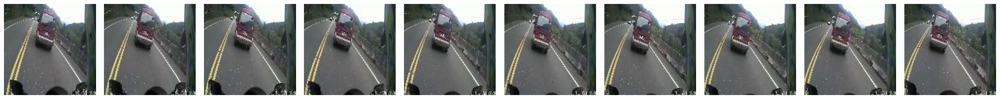

In [22]:
import numpy as np
from openstl.utils import show_video_line

# show the given frames from an example
inputs = np.load('./work_dirs/custom_exp/saved/inputs.npy')
preds = np.load('./work_dirs/custom_exp/saved/preds.npy')
trues = np.load('./work_dirs/custom_exp/saved/trues.npy')

example_idx = 3
show_video_line(trues[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

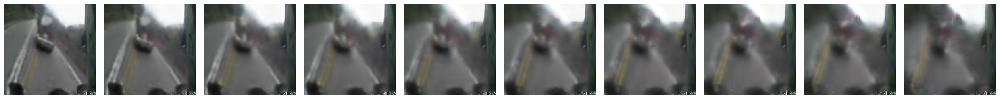

In [23]:
example_idx = 3
show_video_line(preds[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

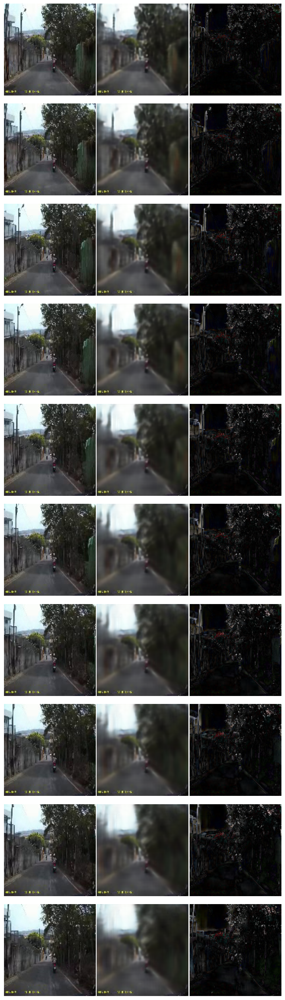

In [31]:
from openstl.utils import show_video_lines_comparison
example_idx = 2
show_video_lines_comparison(trues[example_idx],preds[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

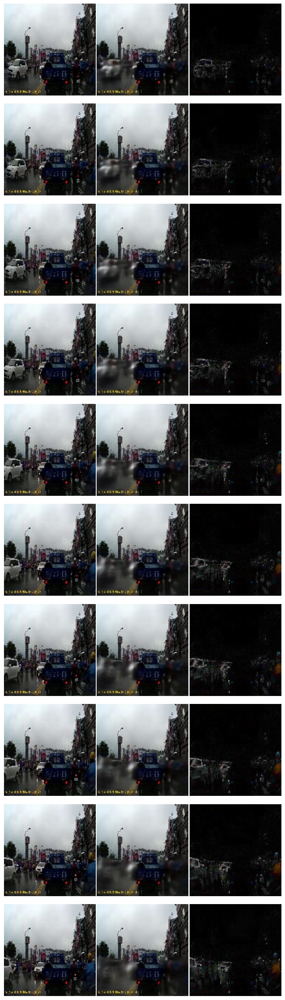

In [76]:
from openstl.utils import show_video_lines_comparison
example_idx = 320
show_video_lines_comparison(trues[example_idx],preds[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

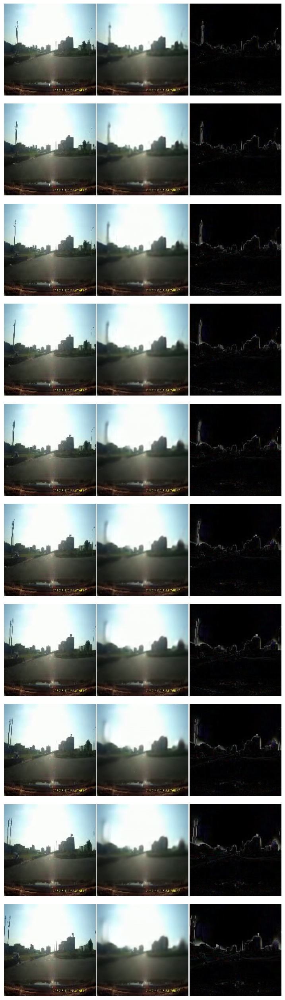

In [85]:
from openstl.utils import show_video_lines_comparison
example_idx = 184
show_video_lines_comparison(trues[example_idx],preds[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

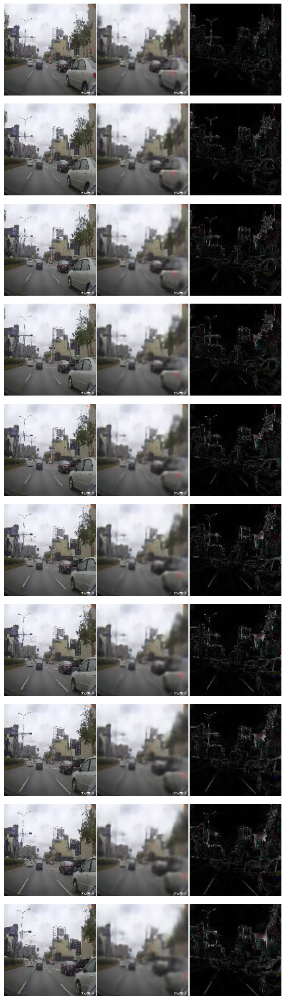

In [86]:
from openstl.utils import show_video_lines_comparison
example_idx = 8
show_video_lines_comparison(trues[example_idx],preds[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

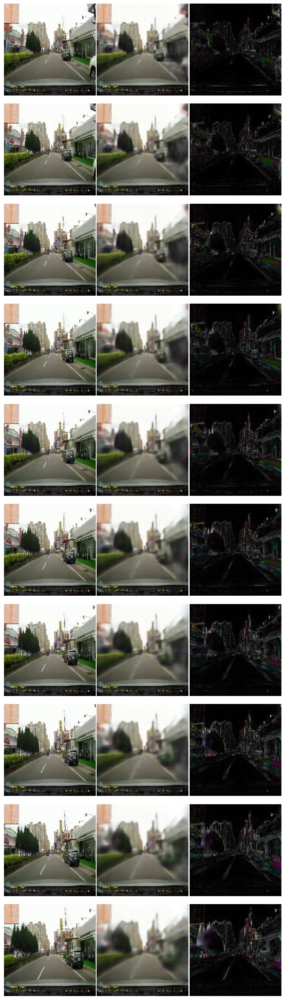

In [88]:
from openstl.utils import show_video_lines_comparison
example_idx = 215
show_video_lines_comparison(trues[example_idx],preds[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)

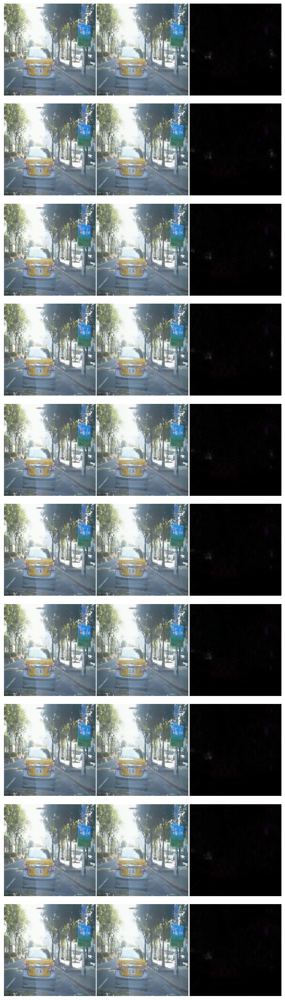

In [54]:
from openstl.utils import show_video_lines_comparison
example_idx = 315
show_video_lines_comparison(inputs[example_idx],preds[example_idx], ncols=aft_seq_length, vmax=0.6, cbar=False, out_path=None, format='png', use_rgb=True)